In [1]:
# @markdown ## Step 1 : Installing Roop

!git clone https://github.com/FurkanGozukara/roop
%cd roop
!pip install onnxruntime-gpu && pip install -r requirements.txt
!pip install onnxruntime-gpu --upgrade
!apt-get update --yes
!apt install nvidia-cuda-toolkit --yes
!pip install opennsfw2 keras --upgrade

from IPython.display import clear_output
clear_output()

print("Done")

Done


In [20]:
#@markdown ## Step 2 : Upload Video

import os
import shutil
from google.colab import files
from IPython.display import HTML, clear_output
from base64 import b64encode
import moviepy.editor as mp


def showVideo(file_path):
    """Function to display video in Colab"""
    mp4 = open(file_path,'rb').read()
    data_url = "data:video/mp4;base64," + b64encode(mp4).decode()
    display(HTML("""
    <video controls width=600>
        <source src="%s" type="video/mp4">
    </video>
    """ % data_url))

def get_video_resolution(video_path):
    """Function to get the resolution of a video"""
    import cv2
    video = cv2.VideoCapture(video_path)
    width = int(video.get(cv2.CAP_PROP_FRAME_WIDTH))
    height = int(video.get(cv2.CAP_PROP_FRAME_HEIGHT))
    return (width, height)

def resize_video(video_path, new_resolution):
    """Function to resize a video"""
    import cv2
    video = cv2.VideoCapture(video_path)
    fourcc = int(video.get(cv2.CAP_PROP_FOURCC))
    fps = video.get(cv2.CAP_PROP_FPS)
    width, height = new_resolution
    output_path = os.path.splitext(video_path)[0] + '_720p.mp4'
    writer = cv2.VideoWriter(output_path, fourcc, fps, (width, height))
    while True:
        success, frame = video.read()
        if not success:
            break
        resized_frame = cv2.resize(frame, new_resolution)
        writer.write(resized_frame)
    video.release()
    writer.release()

upload_method = "Upload" #@param ["Upload"]

# remove previous input video
if os.path.isfile('/content/roop/video.mp4'):
    os.remove('/content/roop/video.mp4')

if upload_method == "Upload":
    uploaded = files.upload()
    for filename in uploaded.keys():
        os.rename(filename, '/content/roop/video.mp4')
    PATH_TO_YOUR_VIDEO = '/content/roop/video.mp4'

# Menampilkan informasi video
video_resolution = get_video_resolution(PATH_TO_YOUR_VIDEO)
print(f"Video resolution: {video_resolution}")
if video_resolution[0] >= 1920 or video_resolution[1] >= 1080:
    print("Resizing video to 720p...")
    os.system(f"ffmpeg -i {PATH_TO_YOUR_VIDEO} -vf scale=1280:720 /content/roop/video.mp4")
    PATH_TO_YOUR_VIDEO = "/content/roop/video.mp4"
    print("Video resized to 720p")
else:
    print("No resizing needed")

# Menampilkan video yang diunggah
if upload_method == "Upload":
  clear_output()
  print("Wait For the step to Finish and the Green Check Mark to appear")
  showVideo(PATH_TO_YOUR_VIDEO)
else:
    if os.path.isfile(PATH_TO_YOUR_VIDEO):
        shutil.copyfile(PATH_TO_YOUR_VIDEO, "/content/roop/video.mp4")
        print("Video")
        showVideo(PATH_TO_YOUR_VIDEO)


Wait For the step to Finish and the Green Check Mark to appear


Face


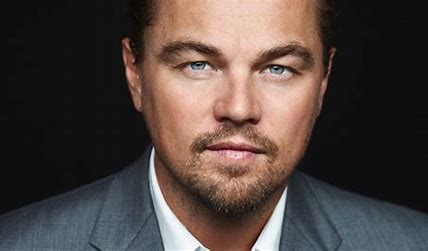

In [2]:
#@markdown ## Step 3: Upload Face Image

import os
import shutil
from google.colab import drive
from google.colab import files
from IPython.display import HTML, clear_output
from base64 import b64encode
import moviepy.editor as mp

upload_method = "Upload" #@param ["Upload"]

# remove previous input video
if os.path.isfile('/content/roop/face.jpg'):
    os.remove('/content/roop/face.jpg')

if upload_method == "Upload":
    uploaded = files.upload()
    for filename in uploaded.keys():
        os.rename(filename, '/content/roop/face.jpg')
    PATH_TO_YOUR_IMAGE = '/content/roop/face.jpg'

from IPython.display import clear_output
clear_output()

print("Face")

from IPython.display import Image
Image("/content/roop/face.jpg", width=320)

---

In [ ]:
import tensorflow as tf
print("Num GPUs Available: ", len(tf.config.experimental.list_physical_devices('GPU')))


In [14]:
#@markdown ## Step 4: Generating Final Video

# Memastikan file video tersedia sebelum menampilkan
import os

# Mengubah direktori ke /content/roop
%cd "/content/roop"

# Menjalankan skrip untuk swap wajah
!python run.py -s "face.jpg" -t "video.mp4" -o "face_swapped_video.mp4" --keep-frames --keep-fps --temp-frame-quality 20 --output-video-quality 20 --execution-provider cuda --frame-processor face_swapper face_enhancer

from IPython.display import clear_output
clear_output()

# Show Generated Video
from IPython.display import HTML
from base64 import b64encode

# Path video input
video_path = "/content/roop/face_swapped_video.mp4"

# Menampilkan video jika ada
if os.path.isfile(video_path):
    # Menampilkan video
    def show_video(video_path):
        mp4 = open(video_path, 'rb').read()
        data_url = "data:video/mp4;base64," + b64encode(mp4).decode()
        return HTML("""
            <video width=320 controls>
                <source src="%s" type="video/mp4">
            </video>
        """ % data_url)

    # Menampilkan video hasil
    display(show_video(video_path))
else:
    print(f"File {video_path} tidak ditemukan.")


In [16]:
#@markdown ## Step 4: Generating Audio
import os
import moviepy.editor as mp
import ipywidgets as widgets
from IPython.display import display, Video

# Fungsi untuk mengunggah file audio
def upload_file(destination_dir, filename):
    upload_widget = widgets.FileUpload(accept='.mp3', multiple=False)
    display(upload_widget)

    def handle_upload(change):
        for file in upload_widget.value:
            file_path = os.path.join(destination_dir, filename)
            with open(file_path, 'wb') as f:
                f.write(upload_widget.value[file]['content'])
            print(f'Successfully uploaded {filename} to {file_path}')
            # Setelah file diunggah, lakukan penggabungan audio dan video
            merge_audio_to_video(output_video_path, file_path, final_output_path)
            print("Final video with new audio created successfully!")
            show_video(final_output_path)

    upload_widget.observe(handle_upload, names='value')

# Fungsi untuk menggabungkan audio baru ke dalam video
def merge_audio_to_video(video_path, audio_path, output_path):
    video = mp.VideoFileClip(video_path)
    audio = mp.AudioFileClip(audio_path)
    final_video = video.set_audio(audio)
    final_video.write_videofile(output_path, codec="libx264", audio_codec="aac")

# Untuk menampilkan video yang sudah jadi
def show_video(file_path):
    display(Video(file_path))

print("Please upload the new audio file.")
if os.path.isfile('/content/roop/audio.mp3'):
    os.remove('/content/roop/audio.mp3')

# Path dari video yang telah di swap face
output_video_path = '/content/roop/face_swapped_video.mp4'
final_output_path = "/content/roop/final_face_swapped_video_with_audio.mp4"

upload_file('/content/roop', 'audio.mp3')


Please upload the new audio file.


FileUpload(value={}, accept='.mp3', description='Upload')

Successfully uploaded audio.mp3 to /content/roop/audio.mp3
Moviepy - Building video /content/roop/final_face_swapped_video_with_audio.mp4.
MoviePy - Writing audio in final_face_swapped_video_with_audioTEMP_MPY_wvf_snd.mp4


MoviePy - Done.
Moviepy - Writing video /content/roop/final_face_swapped_video_with_audio.mp4



Moviepy - Done !
Moviepy - video ready /content/roop/final_face_swapped_video_with_audio.mp4
Final video with new audio created successfully!


In [5]:
#@markdown ## Step 7 : Download Final Video

%cd "/content/roop"
from google.colab import files
files.download('/content/roop/face_swapped_video.mp4')

/content/roop


<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

In [ ]:
# @markdown ## Step 8 : Deleting Old Generated Frames
# @markdown Jalankan langkah ini jika Anda akan membuat video lain dan mulai lagi dari Langkah 2. Anda tidak perlu menjalankan Langkah 1 lagi.
#Deleting Frames
import os
from os import listdir
my_path = '/content/roop/temp/video/'
for file_name in listdir(my_path):
    if file_name.endswith('.png'):
        os.remove(my_path + file_name)
    if file_name.endswith('.mp4'):
        os.remove(my_path + file_name)